In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import glob
import cv2
import numpy as np
import pickle

In [3]:
## Loading camera and distortion matrices

with open("cameraMatrix.pkl", "rb") as mtxFile, open("distMatrix.pkl", "rb") as distFile:
    cameraMatrix = pickle.load(mtxFile)
    distortionMatrix = pickle.load(distFile)
    
def undistort(image):
    global cameraMatrix, distortionMatrix
    return cv2.undistort(image, cameraMatrix, distortionMatrix, None, cameraMatrix)
    

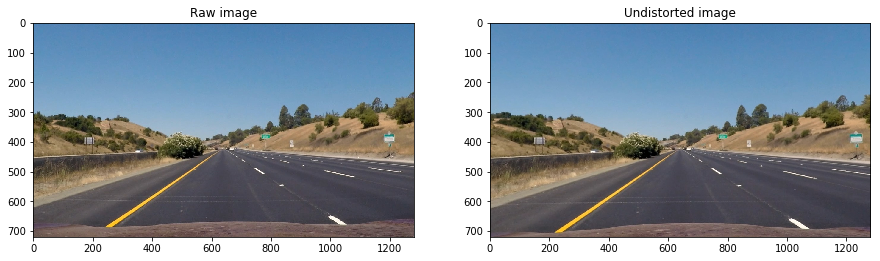

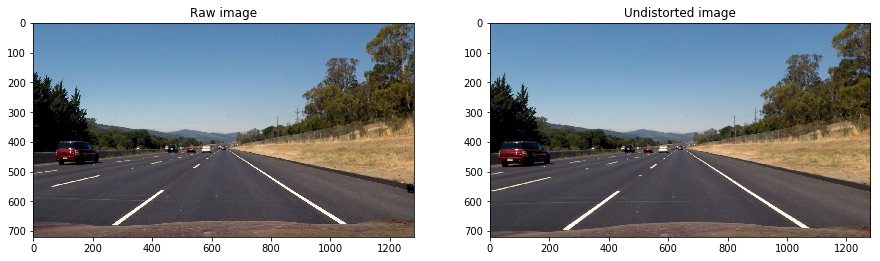

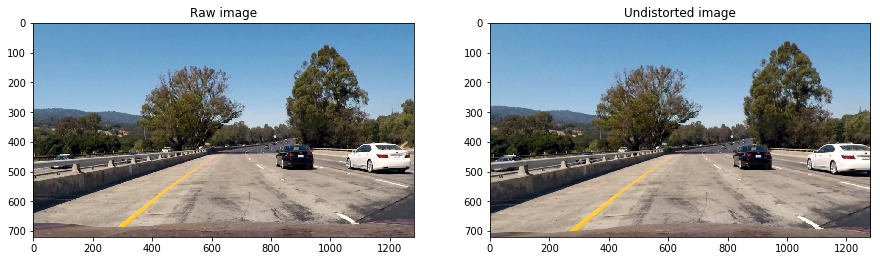

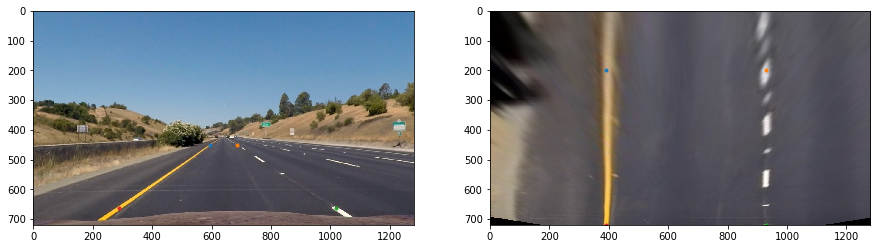

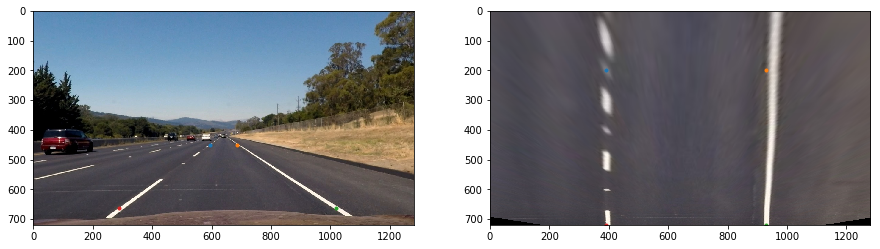

...

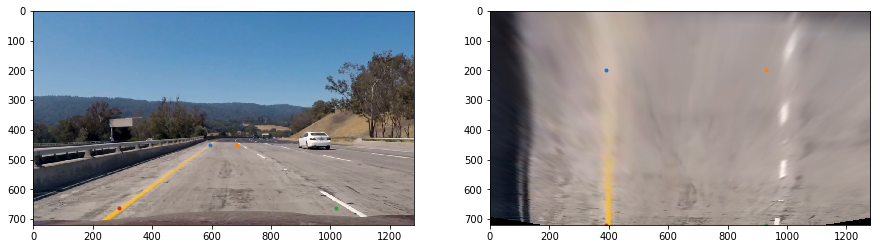

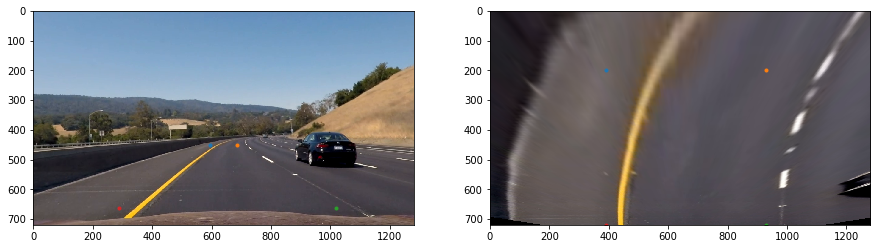

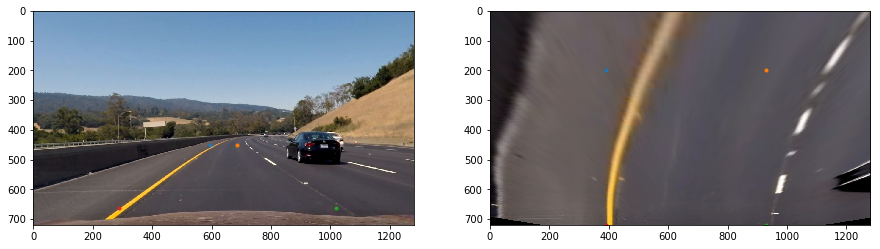

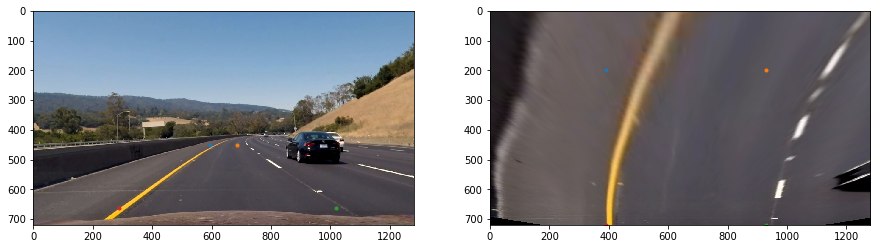

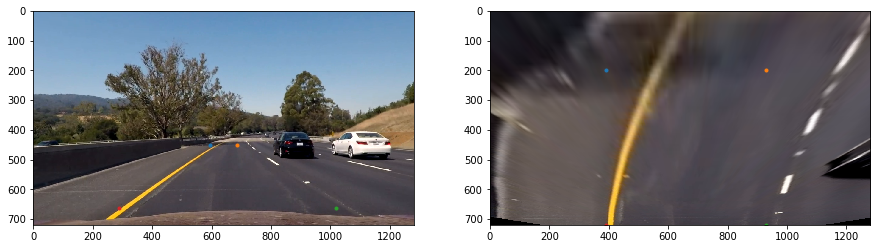

In [4]:
## Preparing perspective transform matrices and applying undistort and perspective transform.

src_x1 = 290
src_x2 = 260
srcPoints = [[595, 450], [685, 450], [1280 - src_x2, 662], [src_x1, 662]]

# keeping proportions between the x-coordinates on the lower side of the image
dst_x1 = src_x1 + 100 # this line compresses the image a bit towards the center, 
                     # so that when a line curves, more segments of it fit into the image
dst_x2 = dst_x1 * src_x2 / src_x1
dstPoints = [[dst_x1, 200], [1280 - dst_x2, 200], [1280 - dst_x2, 719], [dst_x1, 719]]

def getPerspectiveTransform():
    src = np.array(srcPoints, dtype=np.float32)
    dst = np.array(dstPoints, dtype=np.float32)
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    def perspectiveTransform(image):
        img_size = image.shape[:2][::-1]
        return cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    
    def perspectiveTransformInverse(image):
        img_size = image.shape[:2][::-1]
        return cv2.warpPerspective(image, Minv, img_size) 
    
    return perspectiveTransform, perspectiveTransformInverse

perspectiveTransform, perspectiveTransformInverse = getPerspectiveTransform()

def normalizeValue(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_values = hsv[..., 2].reshape(-1)
    histogram, edges = np.histogram(v_values, bins=255)
    percentile = np.percentile(v_values, 80)
    hsv[..., 2] = cv2.multiply(cv2.add(hsv[..., 2], -percentile), 255. / (255 - percentile))
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

rawImages = [cv2.imread(path)[..., ::-1] for path in sorted(glob.glob("test_images/*"))]
undistortedImages = [undistort(img) for img in rawImages]

for raw, undistorted in zip(rawImages[:3], undistortedImages[:3]):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
    ax1.set_title("Raw image")
    ax1.imshow(raw)
    ax2.set_title("Undistorted image")
    ax2.imshow(undistorted)

imagesTransformed = []
for img in undistortedImages:
    transformed = perspectiveTransform(img)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
    ax1.imshow(img)
    for pt in srcPoints:
        ax1.plot(*pt, '.')
    ax2.imshow(transformed)
    for pt in dstPoints:
        ax2.plot(*pt, '.')
        
    imagesTransformed.append(normalizeValue(transformed))


Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=4)]: Done  24 out of  24 | elapsed:    0.0s finished
/home/ilya/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


{'min_samples_leaf': 3, 'min_samples_split': 2, 'max_depth': 3}


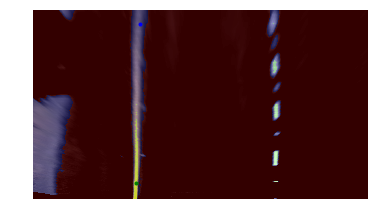

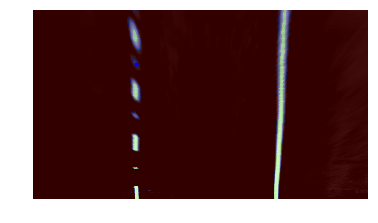

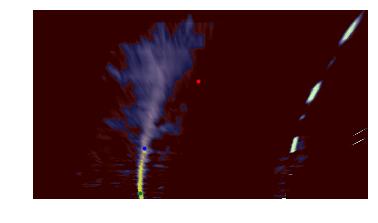

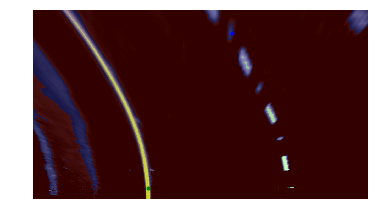

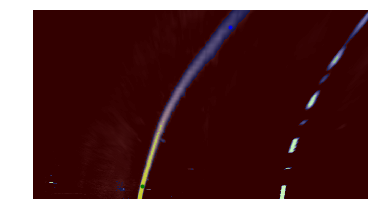

...

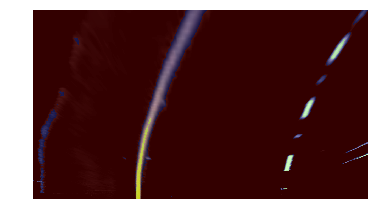

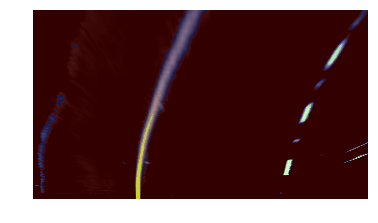

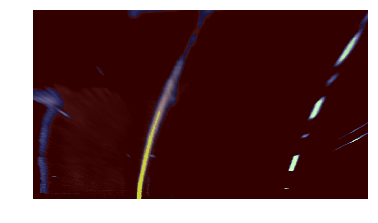

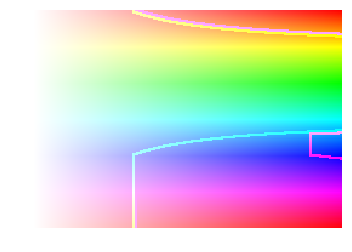

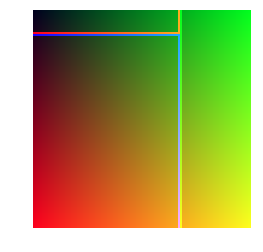

In [5]:
## Collecting training data, training and applying a DecisionTreeClassifier to do color thresholding.

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# This function efficiently applies a decision tree classifier to an image to obtain a mask
# An adaptation of code taken from http://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html#sphx-glr-auto-examples-tree-plot-unveil-tree-structure-py
def apply_tree(clf, image, target_class):
    out = np.zeros(image.shape[:2], dtype=np.uint8)
    
    children_left = clf.tree_.children_left
    children_right = clf.tree_.children_right
    features = clf.tree_.feature
    thresholds = clf.tree_.threshold
    values = clf.tree_.value

    stack = [(0, [])]
    while len(stack) > 0:
        node_id, conditions = stack.pop()

        # If we have a test node
        if (children_left[node_id] != children_right[node_id]):
            conditions_left = conditions + [(features[node_id], thresholds[node_id], True)]
            stack.append((children_left[node_id], conditions_left))
            
            conditions_right = conditions + [(features[node_id], thresholds[node_id], False)]
            stack.append((children_right[node_id], conditions_right))
        else:
            predicted_class = clf.classes_[np.argmax(values[node_id])]
            if predicted_class != target_class:
                continue

            indices = None
            for (feature, threshold, lte) in conditions:
                if lte:
                    indices_local = image[..., feature] <= threshold
                else:
                    indices_local = image[..., feature] > threshold
                if indices is not None:
                    indices &= indices_local
                else:
                    indices = indices_local
            if indices is None:
                indices = np.ones(image.shape[:2], dtype=bool)
            
            out[indices] = 1
    
    return out

clicks = {0: {'lowpass': [(408, 52)], 'pass': [(392, 658)], 'skip': []}, 1: {'lowpass': [(392, 205)], 'pass': [], 'skip': []}, 2: {'lowpass': [(423, 525)], 'pass': [(410, 698)], 'skip': [(630, 268)]}, 3: {'lowpass': [(759, 84)], 'pass': [(439, 679)], 'skip': []}, 4: {'lowpass': [(754, 63)], 'pass': [(416, 669)], 'skip': []}, 5: {'lowpass': [(454, 424)], 'pass': [(423, 666)], 'skip': [(738, 33)]}, 6: {'lowpass': [(583, 115)], 'pass': [], 'skip': []}, 7: {'lowpass': [], 'pass': [(431, 669)], 'skip': [(516, 278)]}}

labelColor = {
    "pass": "g",
    "lowpass": "b",
    "skip": "r"
}

X = [[0, 0, 0], [5, 5, 5], [10, 10, 10], [245, 245, 245], [250, 250, 250], [255, 255, 255]]
Y = ["skip", "skip", "skip", "pass", "pass", "pass"]

for imgIdx, img in enumerate(imagesTransformed):
    for label, points in clicks.get(imgIdx, {}).items():
        for point in points:
            X.append(img.__getitem__(point[::-1]))
        Y.extend([label]*len(points))

X = np.vstack(X)

parameters = {
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [3, 4],
    'max_depth': [3]
}
clf = DecisionTreeClassifier()
clf = GridSearchCV(clf, parameters, verbose=1, n_jobs=4, refit=True)
clf.fit(X, Y)
print(clf.best_params_)

clf = clf.best_estimator_

def mkOnclick(idx):
    mouseBtnToLabel = {
        1: "pass",
        3: "skip"
    }
    def onclick(event):
        if idx not in clicks:
            clicks[idx] = { "lowpass": [], "skip": [], "pass": [] }
        label = mouseBtnToLabel[event.button]
        if label not in clicks[idx]:
            clicks[idx][label] = []
        clicks[idx][label].append((int(event.xdata), int(event.ydata)))
        
        plots[idx].axes[0].plot(int(event.xdata), int(event.ydata), labelColor[label] + '.')
        plots[idx].draw()
        
    return onclick

def plot_clf_masked_image(image, clf, img_weight=0.8, mask_edges=True):
    mask = np.dstack([
        apply_tree(clf, image, "skip") * 255,
        apply_tree(clf, image, "pass") * 255,
        apply_tree(clf, image, "lowpass") * 255
    ])
    
    if mask_edges:
        mask_color = cv2.cvtColor(mask, cv2.COLOR_RGB2HSV)[..., 0]
        sobelx = np.absolute(cv2.Sobel(mask_color, cv2.CV_64F, 1, 0))
        sobely = np.absolute(cv2.Sobel(mask_color, cv2.CV_64F, 0, 1))
        mask_sobel = np.zeros(sobelx.shape, dtype=np.uint8)
        mask_sobel[(sobelx > 0) | (sobely > 0)] = 1
        mask_sobel = cv2.dilate(mask_sobel, np.ones((3, 3)))
        mask = np.multiply(mask, mask_sobel.reshape((*mask_sobel.shape, 1)))
        
    fig, ax = plt.subplots()
    if not mask_edges:
        plt.imshow(cv2.addWeighted(image, img_weight, mask, 1. - img_weight, 0))
    else:
        plt.imshow(cv2.add(image, mask))
    ax.axis('off')
        
    return fig
    
plots = []
for imgIdx, img in enumerate(imagesTransformed):
    fig = plot_clf_masked_image(img, clf, mask_edges=False)
    for label, points in clicks.get(imgIdx, {}).items():
        if len(points):
            plt.plot(*zip(*points), labelColor[label] + '.')
        
    fig.canvas.mpl_connect('button_press_event', mkOnclick(imgIdx))
    plots.append(fig)
    fig.show()

hs_img = np.zeros((180, 255, 3), dtype=np.uint8)
hs_img[..., 2] = 255
for i in range(255):
    if i < 180:
        hs_img[i, :, 0] = i
    hs_img[:, i, 1] = i
    
plot_clf_masked_image(cv2.cvtColor(hs_img, cv2.COLOR_HSV2RGB), clf, mask_edges=True).show()

sv_img = np.zeros((255, 255, 3), dtype=np.uint8)
sv_img[..., 2] = 30
for i in range(255):
    sv_img[i, :, 0] = i
    sv_img[:, i, 1] = i
    
plot_clf_masked_image(sv_img, clf, mask_edges=True).show()

In [6]:
print(clicks)

{0: {'skip': [], 'pass': [(392, 658)], 'lowpass': [(408, 52)]}, 1: {'skip': [], 'pass': [], 'lowpass': [(392, 205)]}, 2: {'skip': [(630, 268)], 'pass': [(410, 698)], 'lowpass': [(423, 525)]}, 3: {'skip': [], 'pass': [(439, 679)], 'lowpass': [(759, 84)]}, 4: {'skip': [], 'pass': [(416, 669)], 'lowpass': [(754, 63)]}, 5: {'skip': [(738, 33)], 'pass': [(423, 666)], 'lowpass': [(454, 424)]}, 6: {'skip': [], 'pass': [], 'lowpass': [(583, 115)]}, 7: {'skip': [(516, 278)], 'pass': [(431, 669)], 'lowpass': []}}


In [7]:
## Obtaining high pass and low pass masks from color thresholding; also implementation of Sobel gradient filtering

def colorMasks(img):
    global clf
    
    addMask = apply_tree(clf, img, 'pass')
    subtractMask = apply_tree(clf, img, 'skip')
    
    return (addMask, subtractMask)

def sobel(img, x_thresh_min, x_thresh_max, y_thresh_min, y_thresh_max):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    gray = hsv[..., 2]
    # gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in x
    abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
    
    sobel_binary = np.zeros_like(scaled_sobelx)
    sobel_binary[(scaled_sobelx >= x_thresh_min) & (scaled_sobelx <= x_thresh_max) & (scaled_sobely >= y_thresh_min) & (scaled_sobely <= y_thresh_max)] = 1
    return sobel_binary

In [8]:
from ipywidgets import interactive

In [9]:
## A class that takes a warped image as input and produces a binary mask as output.
## Implementing this as a class makes it simpler to implement the interactive code below.

class Threshold:
    def __init__(self, x_thresh_min=None, x_thresh_max=None, y_thresh_min=None, y_thresh_max=None, opening_window=None, closing_window=None):
        self.x_thresh_min = x_thresh_min
        self.x_thresh_max = x_thresh_max
        self.y_thresh_min = y_thresh_min
        self.y_thresh_max = y_thresh_max
        self.opening_window = opening_window
        self.closing_window = closing_window
        
    def apply(self, img):
        addMask, subtractMask = colorMasks(img)
        sxbinary = sobel(img, self.x_thresh_min, self.x_thresh_max, self.y_thresh_min, self.y_thresh_max)

        mask = np.zeros_like(sxbinary)
        mask[((sxbinary == 1) | (addMask == 1)) & (subtractMask == 0)] = 1

        opening = cv2.morphologyEx(mask, cv2.MORPH_OPEN, np.ones((self.opening_window, self.opening_window), dtype=np.uint8))

        closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, np.ones((1, self.closing_window), dtype=np.uint8))
        closing = cv2.morphologyEx(closing, cv2.MORPH_CLOSE, np.ones((self.closing_window, 1), dtype=np.uint8))
        
        return closing

In [10]:
## The implementation of sliding windows search for candidate points.

def histogram_modes(binary_warped):
    window_size = 15
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[2*binary_warped.shape[0]//3:,:], axis=0, dtype=np.float64)
    histogram = np.cumsum(histogram[window_size:]) - np.cumsum(histogram[:-window_size])
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = histogram.shape[0]//2
    leftx_base = np.argmax(histogram[:midpoint]) + window_size // 2
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint + window_size // 2
    return (histogram, leftx_base, rightx_base)
    
def slidingWindows(binary_warped, prev_fits):
    (_, leftx_base, rightx_base) = histogram_modes(binary_warped)
    if prev_fits is not None:
        # If previous fits are present, try to use them to improve the position of the first window.
        leftx_base = (leftx_base + np.polyval(prev_fits[0], binary_warped.shape[0])) / 2.
        rightx_base = (rightx_base + np.polyval(prev_fits[1], binary_warped.shape[0])) / 2.
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    windows = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        if prev_fits is not None and window > 0:
            # If previous fits are present, use them to shift every next window according to the current curve.
            leftx_current += (np.polyval(prev_fits[0], win_y_low) - np.polyval(prev_fits[0], win_y_high)) / 2.
            rightx_current += (np.polyval(prev_fits[1], win_y_low) - np.polyval(prev_fits[1], win_y_high)) / 2.
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        windows.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    if len(lefty):
        left_fit = np.polyfit(lefty, leftx, 2)
        # Some images only have lane line points in the bottom half; for those images the polynomial fit is very 
        # noisy, so I'm dropping those fits later.
        reject_left = np.sum(lefty < binary_warped.shape[0] // 2) < 0.1 * len(lefty)
    else:
        left_fit = None
        reject_left = True

    if len(righty):
        right_fit = np.polyfit(righty, rightx, 2)
        reject_right = np.sum(righty < binary_warped.shape[0] // 2) < 0.1 * len(lefty)
    else:
        right_fit = None
        reject_right = True
    
    return (
        windows, 
        (nonzerox, nonzeroy), 
        (left_lane_inds, right_lane_inds), 
        (left_fit, right_fit),
        (reject_left, reject_right)
    )

def drawPoly(srcImage, binary_warped, fits):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    (left_fit, right_fit) = fits
    
    if left_fit is not None and right_fit is not None:
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = perspectiveTransformInverse(color_warp)
    # Combine the result with the original image
    result = cv2.addWeighted(srcImage, 1, newwarp, 0.3, 0)
    return result

In [11]:
threshold_params = {
    "x_thresh_min": 13,
    "x_thresh_max": 255,
    "y_thresh_min": 0,
    "y_thresh_max": 49,
    "opening_window": 2,
    "closing_window": 5
}


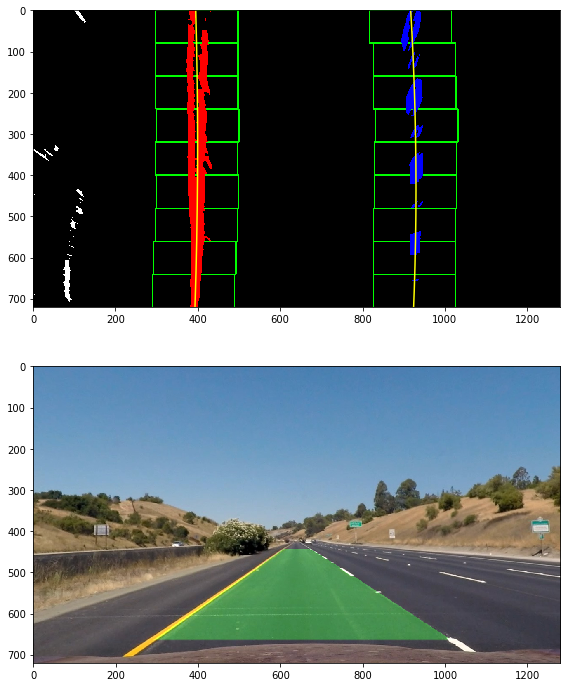

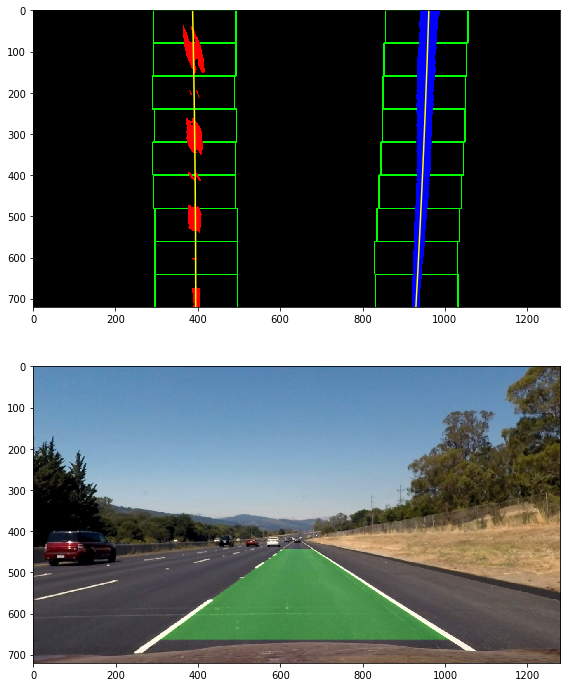

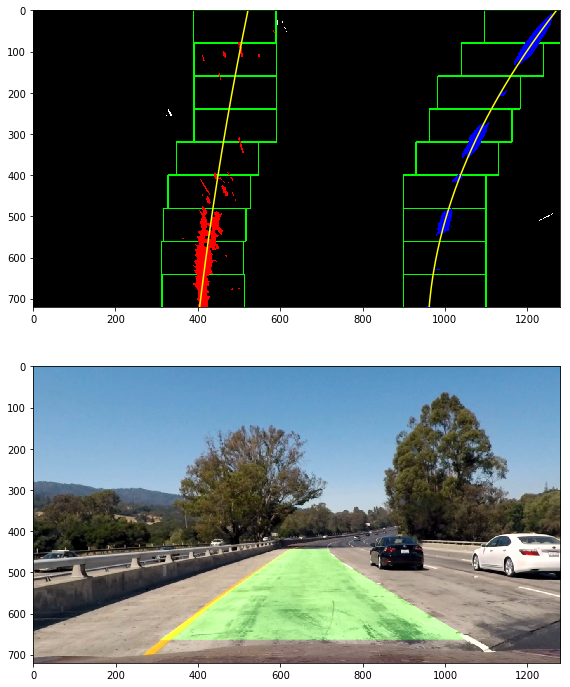

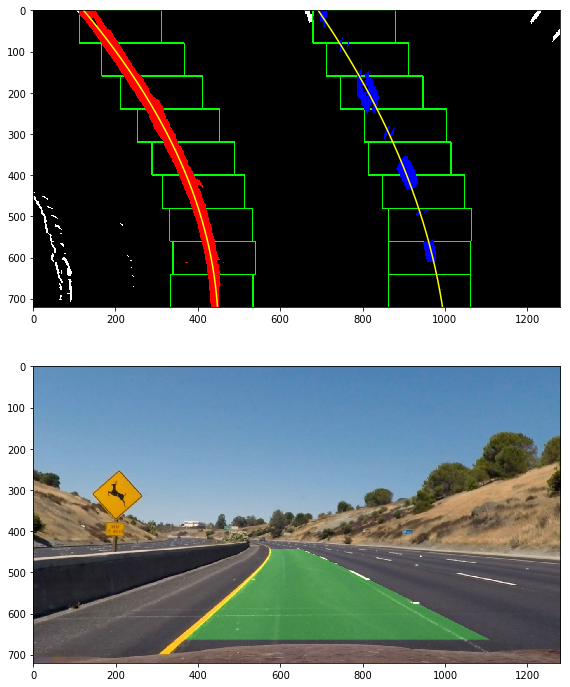

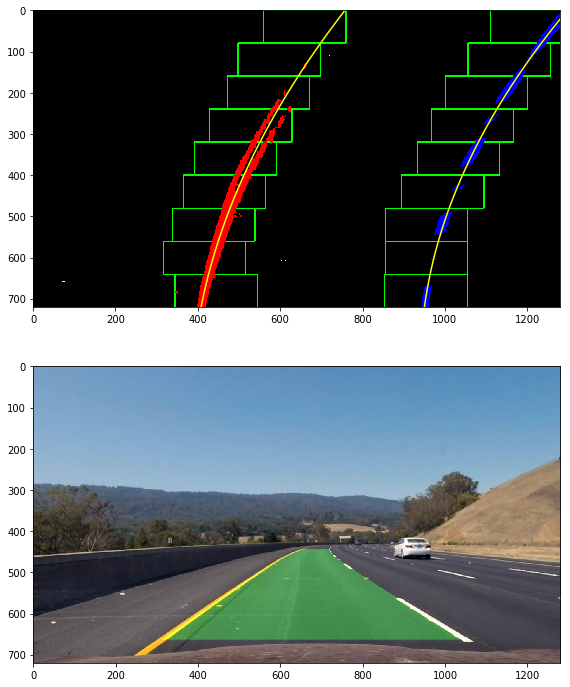

...

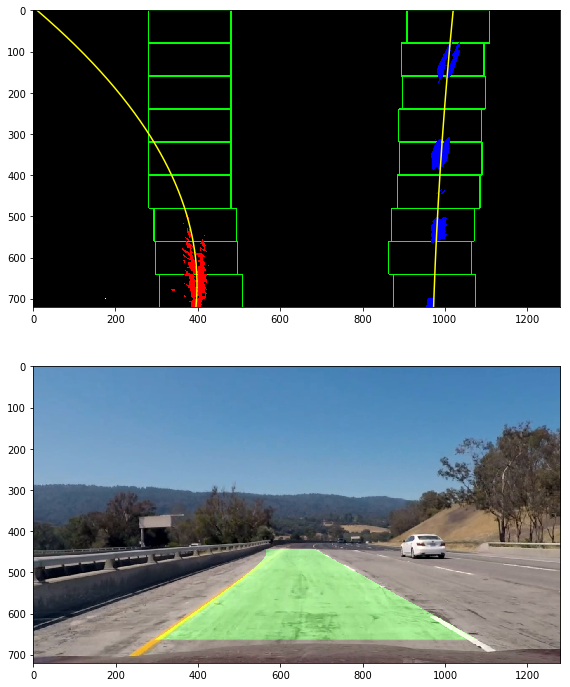

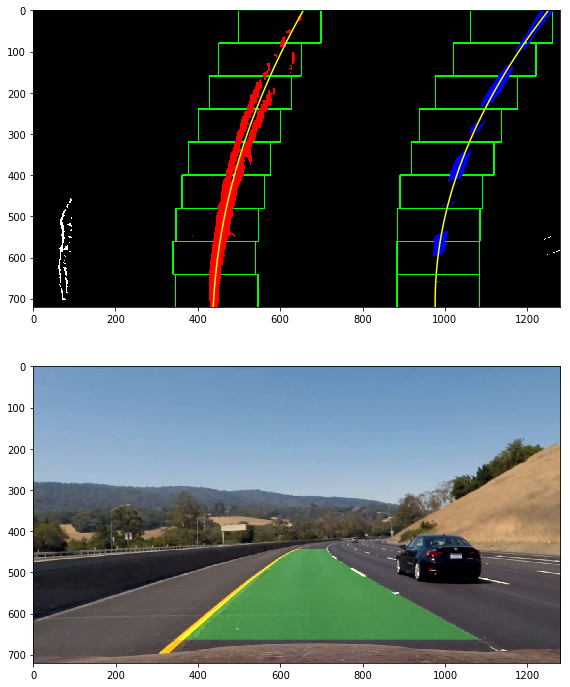

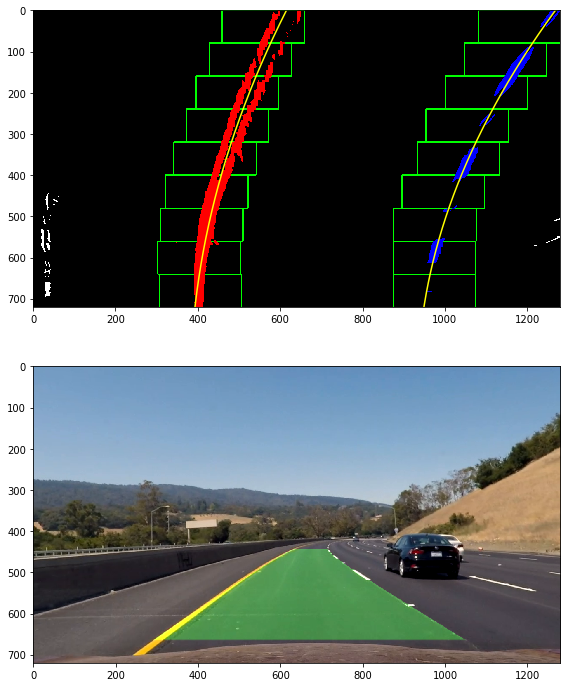

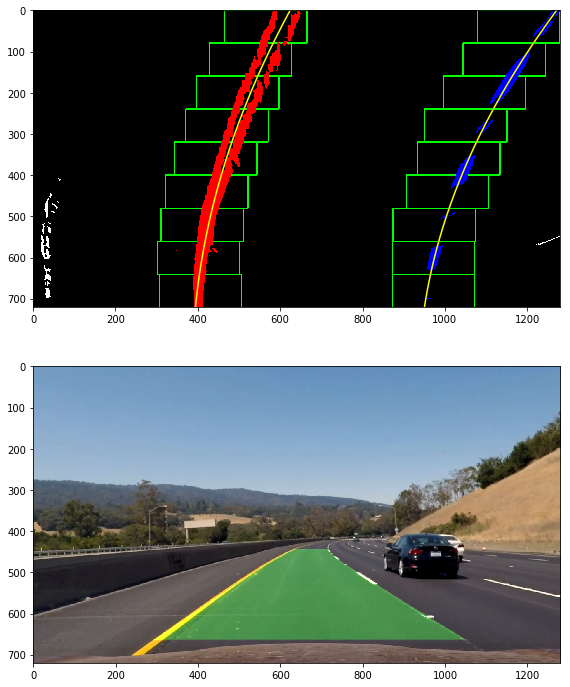

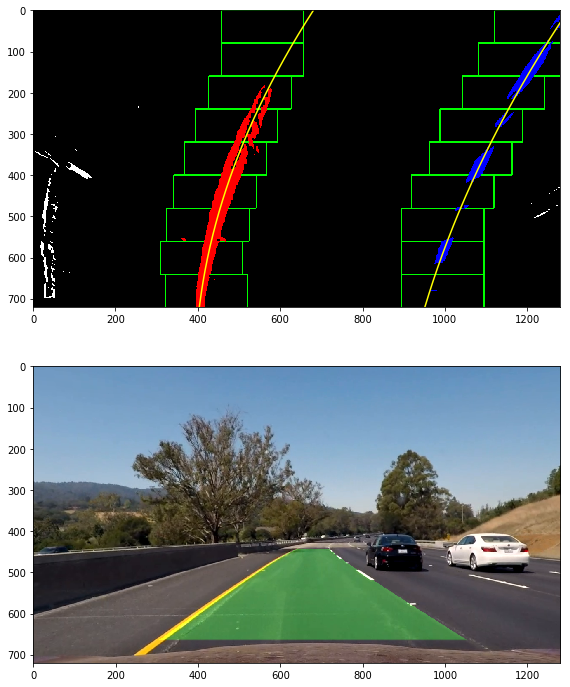

In [12]:
def plot_sliding_windows(normalizedImage, srcImage, ax, **threshold_params):
    binary_warped = Threshold(**threshold_params).apply(normalizedImage)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    windows, nonzeros, inds, fits, reject = slidingWindows(binary_warped, None)
    for (win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high) in windows:
        # Draw the windows on the visualization image
        cv2.rectangle(
            out_img,
            (win_xleft_low, win_y_low),
            (win_xleft_high, win_y_high),
            (0, 255, 0), 
            2
        ) 
        cv2.rectangle(
            out_img,
            (win_xright_low, win_y_low),
            (win_xright_high, win_y_high),
            (0, 255, 0), 
            2
        )
        
    # plot windows
    
    (nonzerox, nonzeroy) = nonzeros
    (left_fit, right_fit) = fits
    (left_lane_inds, right_lane_inds) = inds
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    ax.imshow(out_img)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    ax.set_xlim(0, 1280)
    ax.set_ylim(720, 0)    

    return (binary_warped, fits)

for image, srcImage in zip(imagesTransformed, undistortedImages):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11, 12))
    
    (binary_warped, fits) = plot_sliding_windows(image, srcImage, ax1, **threshold_params)
    
    ax2.imshow(drawPoly(srcImage, binary_warped, fits))    

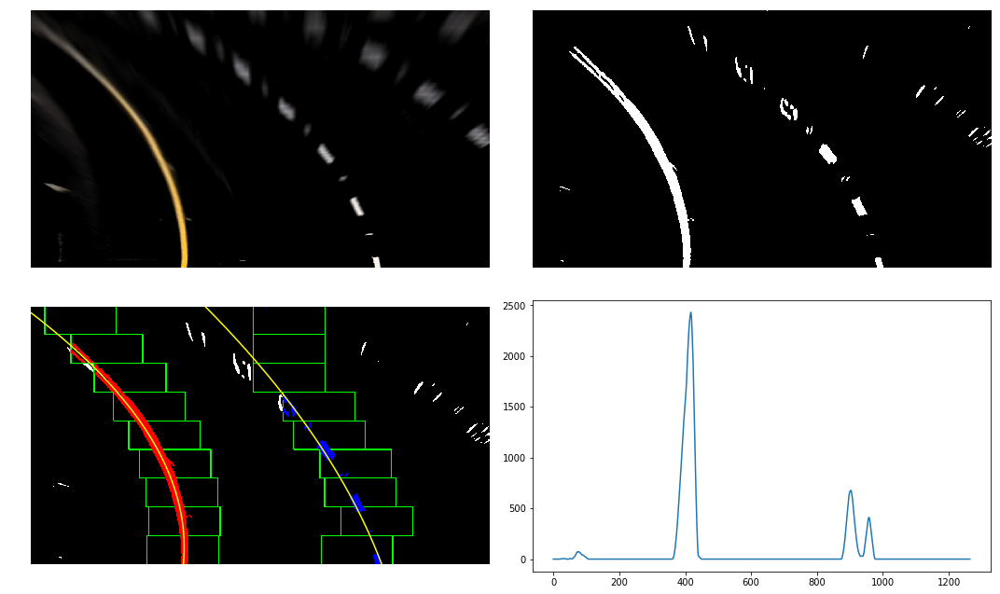

In [13]:
def f(idx=10, x_thresh_min=13, x_thresh_max=255, y_thresh_min=0, y_thresh_max=49, opening_window=2, closing_window=5):
    img = imagesTransformed[idx]

    closing = Threshold(x_thresh_min, x_thresh_max, y_thresh_min, y_thresh_max, opening_window, closing_window).apply(img)
    
    (histogram, leftx_base, rightx_base) = histogram_modes(closing)
    
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 9))

    ax1.imshow(img)
    ax2.imshow(closing, cmap="gray")
    ax4.plot(histogram)
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
   
    plot_sliding_windows(
        img, 
        undistortedImages[idx], 
        ax3, 
        x_thresh_min=x_thresh_min, 
        x_thresh_max=x_thresh_max, 
        y_thresh_min=y_thresh_min, 
        y_thresh_max=y_thresh_max, 
        opening_window=opening_window, 
        closing_window=closing_window
    )
    
    f.tight_layout()

interactive_plot = interactive(
    f, 
    idx=(0, len(imagesTransformed) - 1),
    x_thresh_min=(0, 255), 
    x_thresh_max=(0, 255),
    y_thresh_min=(0, 255), 
    y_thresh_max=(0, 255),
    opening_window=(1, 5),
    closing_window=(1, 50)
)
interactive_plot

In [14]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [15]:
import time
from collections import defaultdict

def infer_fit(bad_fit, good_fit):
    result = good_fit.copy()
    result[2] += np.polyval(bad_fit, 720) - np.polyval(good_fit, 720)
    return result

def convert_curvature(left_fit, right_fit):
    # Define conversions in x and y from pixels space to meters

    # Meters per pixel in y dimension
    # In order to obtain this number, I compared the right lane to the length of the car on the video.
    # The green polygon extends approximately 11 cars forward; I'm assuming a sedan is ~4.5 m long.
    ym_per_pix = 50/720 
    
    xm_per_pix = 3.7/550 # meters per pixel in x dimension

    scale_coeff = np.array([xm_per_pix / ym_per_pix**2, xm_per_pix / ym_per_pix, xm_per_pix])
    y_eval = 720
    
    # Transform polynomials to world space
    left_fit_cr = np.multiply(left_fit, scale_coeff)
    right_fit_cr = np.multiply(right_fit, scale_coeff)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    left_lane_x = np.polyval(left_fit, 720)
    right_lane_x = np.polyval(right_fit, 720)
    car_offset = (640 - (left_lane_x + right_lane_x)/2) * xm_per_pix
    
    return (left_curverad, right_curverad, car_offset)

class ClipProcessor:
    def __init__(self, x_thresh_min=None, x_thresh_max=None, y_thresh_min=None, y_thresh_max=None, opening_window=None, closing_window=None):
        self.x_thresh_min = x_thresh_min
        self.x_thresh_max = x_thresh_max
        self.y_thresh_min = y_thresh_min
        self.y_thresh_max = y_thresh_max
        self.opening_window = opening_window
        self.closing_window = closing_window
        
        self.left_fits = []
        self.right_fits = []
        self.left_fit = None
        self.right_fit = None
        self.left_fits_clean = []
        self.right_fits_clean = []
        self.times = defaultdict(float)
        self.frame = 0
        self.rejects = 0
    
    def process_image(self, image):
        rawImage = image.copy()
        time_1 = time.clock()
        image = undistort(image)
        undistortedImage = image.copy()
        time_2 = time.clock()
        image = perspectiveTransform(image)
        time_3 = time.clock()
        image = normalizeValue(image)
        time_4 = time.clock()
        binary_warped = Threshold(
            x_thresh_min=self.x_thresh_min,
            x_thresh_max=self.x_thresh_max,
            y_thresh_min=self.y_thresh_min,
            y_thresh_max=self.y_thresh_max,
            opening_window=self.opening_window, 
            closing_window=self.closing_window
        ).apply(image)*255
        time_5 = time.clock()

        # prev_fits = (self.left_fit, self.right_fit) if self.left_fit is not None else None
        if not self.left_fits:
            windows, nonzeros, inds, fits, reject = slidingWindows(binary_warped, None)    
        else:
            windows, nonzeros, inds, fits, reject = slidingWindows(binary_warped, (self.left_fit, self.right_fit))
        time_6 = time.clock()
        
        self.times["undistort"] += time_2 - time_1
        self.times["perspective"] += time_3 - time_2
        self.times["normalize"] += time_4 - time_3
        self.times["threshold"] += time_5 - time_4
        self.times["windows"] += time_6 - time_5
        
        (left_fit, right_fit) = fits
        
        if not reject[0]:
            self.left_fits.append(left_fit)
        else:
            if not reject[1] and left_fit is not None and right_fit is not None:
                self.left_fits.append(infer_fit(left_fit, right_fit))
            else:
                self.left_fits.append(self.left_fit)
            self.rejects += 1
            
        if not reject[1]:
            self.right_fits.append(right_fit)
        else:
            if not reject[0] and left_fit is not None and right_fit is not None:
                self.right_fits.append(infer_fit(right_fit, left_fit))
            else:
                self.right_fits.append(self.right_fit)
            self.rejects += 1
        
        self.left_fit = np.average(np.vstack(self.left_fits[-10:]), axis=0)
        self.right_fit = np.average(np.vstack(self.right_fits[-10:]), axis=0)

        self.left_fits_clean.append(self.left_fit)
        self.right_fits_clean.append(self.right_fit)
        
        result = drawPoly(undistortedImage, binary_warped, (self.left_fit, self.right_fit))

        (left_curverad, right_curverad, car_offset) = convert_curvature(self.left_fit, self.right_fit)
        result = cv2.putText(result, "Left line curvature: {} m".format(left_curverad),
            (10, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2, cv2.LINE_AA)
        result = cv2.putText(result, "Right line curvature: {} m".format(right_curverad),
            (10, 45), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2, cv2.LINE_AA)
        result = cv2.putText(result, "Car is offset {} m to the {}".format(np.abs(car_offset),
                "right" if car_offset > 0 else "left"), 
            (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2, cv2.LINE_AA)

## Uncommenting the following code allows to dump problematic images for debugging.
#         left_origin_x = np.polyval(left_fit, 720)
#         right_origin_x = np.polyval(right_fit, 720)
        
#         if (left_origin_x < 300 or left_origin_x > 500 or right_origin_x < 850 or right_origin_x > 1100
#             or left_fit[0] * right_fit[0] < 0 or left_fit[1] * right_fit[1] < 0):
#             plt.imsave("debug_img/frame_{}.png".format(self.frame), rawImage)
#             plt.imsave("debug_img/frame_{}_result.png".format(self.frame), result)
        
        self.frame += 1
        
        return result

In [16]:
# This cell implements random search for parameters

# import random
# import pickle
# import uuid

# project_output_path = "project_video_output.mp4"

# left_fits = []
# right_fits = []

# while True:
#     x_thresh_min = random.choice(range(20))
#     y_thresh_min = random.choice(range(20))
    
#     params = {
#         "x_thresh_min": x_thresh_min,
#         "x_thresh_max": x_thresh_min + random.choice(range(50)),
#         "y_thresh_min": y_thresh_min,
#         "y_thresh_max": y_thresh_min + random.choice(range(50)),
#         "opening_window": random.choice([1, 2, 3, 4, 5, 6]),
#         "closing_window": 1 + random.choice(range(50))
#     }

#     project_video = VideoFileClip("project_video.mp4") #.subclip(0, 10)

#     processor = ClipProcessor(**params)
#     project_video_output = project_video.fl_image(processor.process_image)

#     # %time 
#     project_video_output.write_videofile(project_output_path, audio=False)
    
#     result = {
#         "params": params,
#         "results": {
#             "left": np.array(processor.left_fits),
#             "right": np.array(processor.right_fits)
#         }
#     }
    
#     with open("random_search/" + str(uuid.uuid4()), "wb") as dumpFile:
#         pickle.dump(result, dumpFile)
    

In [17]:
project_output_path = "project_video_output.mp4"

In [18]:
project_video = VideoFileClip("project_video.mp4")

processor = ClipProcessor(**threshold_params)
project_video_output = project_video.fl_image(processor.process_image)

# %time 
project_video_output.write_videofile(project_output_path, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [02:24<00:00,  8.50it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 



In [19]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output_path))

In [20]:
print(processor.times)

defaultdict(<class 'float'>, {'windows': 11.797172000001112, 'threshold': 109.45702399999993, 'perspective': 18.231631999999827, 'normalize': 87.61488799999971, 'undistort': 42.389311000000376})


154
[  1.61669018e-10   1.85604332e-04   2.17060103e+01]
[  1.55162031e-10   1.91211037e-04   2.53562515e+01]
[  1.23420404e-08   2.76119012e-02   5.79351576e+03]


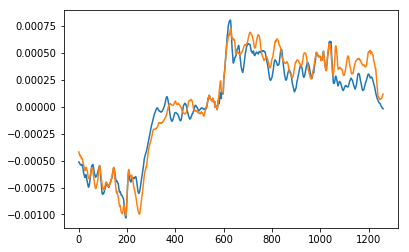

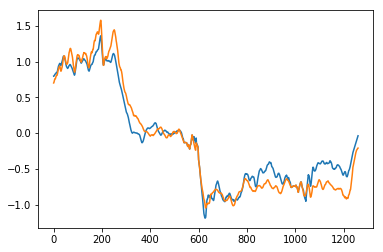

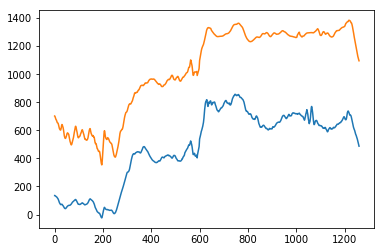

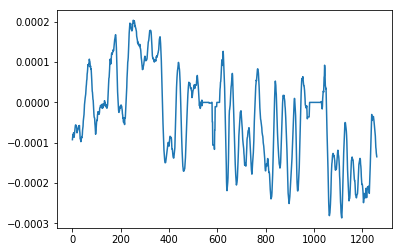

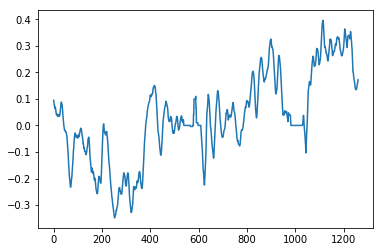

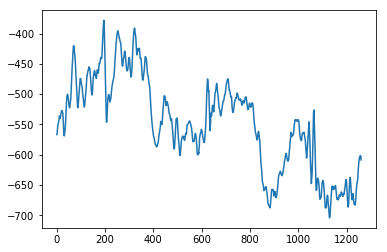

In [21]:
## This code plots graphs of differences between fits, either between consecutive frames or between left and 
# right lines.
# Without the extra cleaning steps implemented (moving average, rejecting bad fits, etc.) the graphs display
# huge outliers.
# Since the video has a good framerate, those graphs should be smooth.
# I was optimizing the pipeline until the graphs became sufficiently smooth.

left_fits = np.array(processor.left_fits_clean)
right_fits = np.array(processor.right_fits_clean)

print(processor.rejects)

# Variance provides a way to express smoothness of these graphs in form of numbers.
print(np.var(left_fits[1:] - left_fits[:-1], axis=0))
print(np.var(right_fits[1:] - right_fits[:-1], axis=0))
print(np.var(right_fits - left_fits, axis=0))

plt.figure()
plt.plot(left_fits[:, 0])
plt.plot(right_fits[:, 0])
plt.figure()
plt.plot(left_fits[:, 1])
plt.plot(right_fits[:, 1])
plt.figure()
plt.plot(left_fits[:, 2])
plt.plot(right_fits[:, 2])
plt.figure()
plt.plot((left_fits - right_fits)[:, 0])
plt.figure()
plt.plot((left_fits - right_fits)[:, 1])
plt.figure()
plt.plot((left_fits - right_fits)[:, 2])
